In [2]:
import pandas as pd
import numpy as np 
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,confusion_matrix,roc_auc_score,roc_curve
from pandas_profiling import ProfileReport

In [3]:
df=pd.read_csv("winequality-red.csv")


In [4]:
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [5]:
pf=ProfileReport(df)

In [6]:
pf

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [7]:
pf.to_widgets()

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

In [8]:
set(df.quality)

{3, 4, 5, 6, 7, 8}

In [9]:
X=df.drop(columns=["quality"])

In [10]:
Y=df["quality"]

In [11]:
x_train,x_test,y_train,y_test=train_test_split(X,Y,test_size=0.25,random_state=300)

In [12]:
dt_model=DecisionTreeClassifier()

In [13]:
dt_model.fit(x_train,y_train)

DecisionTreeClassifier()

In [14]:
import matplotlib.pyplot as plt
from sklearn import tree
%matplotlib inline
import sklearn

[Text(551.897702991453, 1065.4560000000001, 'X[10] <= 10.15\ngini = 0.638\nsamples = 1199\nvalue = [5, 41, 512, 487, 139, 15]'),
 Text(290.8568376068376, 1021.9680000000001, 'X[1] <= 0.548\ngini = 0.506\nsamples = 594\nvalue = [3, 20, 374, 184, 12, 1]'),
 Text(168.57905982905984, 978.48, 'X[6] <= 60.5\ngini = 0.554\nsamples = 264\nvalue = [0, 7, 134, 114, 8, 1]'),
 Text(82.7991452991453, 934.9920000000001, 'X[9] <= 0.585\ngini = 0.56\nsamples = 178\nvalue = [0, 5, 68, 96, 8, 1]'),
 Text(40.27350427350427, 891.504, 'X[5] <= 8.5\ngini = 0.528\nsamples = 55\nvalue = [0, 4, 33, 18, 0, 0]'),
 Text(21.196581196581196, 848.0160000000001, 'X[10] <= 9.85\ngini = 0.265\nsamples = 20\nvalue = [0, 1, 17, 2, 0, 0]'),
 Text(12.717948717948719, 804.528, 'X[9] <= 0.435\ngini = 0.105\nsamples = 18\nvalue = [0, 0, 17, 1, 0, 0]'),
 Text(8.478632478632479, 761.0400000000001, 'X[0] <= 10.05\ngini = 0.5\nsamples = 2\nvalue = [0, 0, 1, 1, 0, 0]'),
 Text(4.239316239316239, 717.552, 'gini = 0.0\nsamples = 1\nv

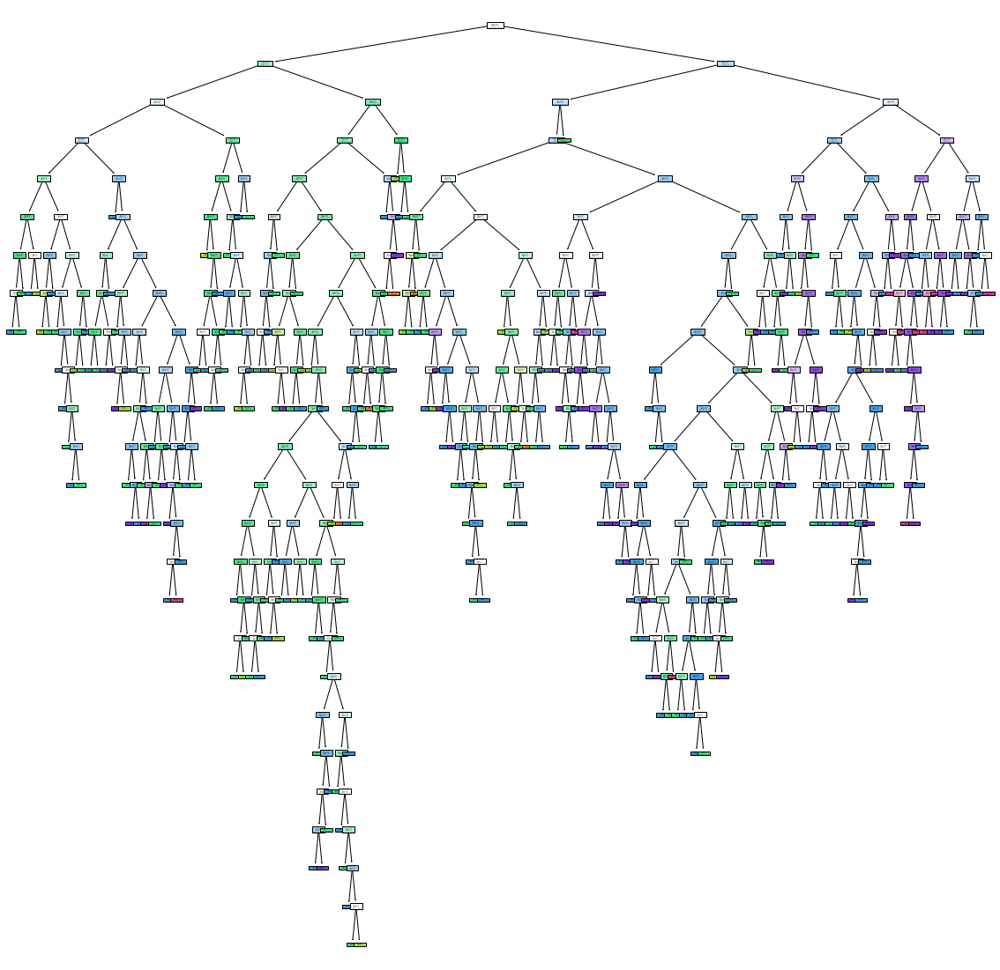

In [15]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model,filled=True)

In [16]:
df1=df.head(500)

In [17]:
x1=df1.drop(columns="quality")
y1=df1["quality"]

In [18]:
dtmodel1=DecisionTreeClassifier()
dtmodel1.fit(x1,y1)

DecisionTreeClassifier()

[Text(502.4111266816144, 1055.2235294117647, 'alcohol <= 9.85\ngini = 0.624\nsamples = 500\nvalue = [1, 16, 239, 184, 52, 8]\nclass = 5'),
 Text(316.1582959641256, 991.2705882352941, 'total sulfur dioxide <= 62.5\ngini = 0.504\nsamples = 259\nvalue = [1, 12, 167, 72, 6, 1]\nclass = 5'),
 Text(197.92735426008971, 927.3176470588236, 'citric acid <= 0.415\ngini = 0.576\nsamples = 169\nvalue = [1, 9, 91, 61, 6, 1]\nclass = 5'),
 Text(87.57847533632288, 863.364705882353, 'alcohol <= 9.05\ngini = 0.525\nsamples = 131\nvalue = [0, 8, 81, 39, 3, 0]\nclass = 5'),
 Text(24.021524663677134, 799.4117647058824, 'sulphates <= 0.54\ngini = 0.403\nsamples = 12\nvalue = [0, 2, 1, 9, 0, 0]\nclass = 6'),
 Text(16.014349775784755, 735.4588235294118, 'density <= 0.998\ngini = 0.444\nsamples = 3\nvalue = [0, 2, 1, 0, 0, 0]\nclass = 4'),
 Text(8.007174887892377, 671.5058823529412, 'gini = 0.0\nsamples = 2\nvalue = [0, 2, 0, 0, 0, 0]\nclass = 4'),
 Text(24.021524663677134, 671.5058823529412, 'gini = 0.0\nsamp

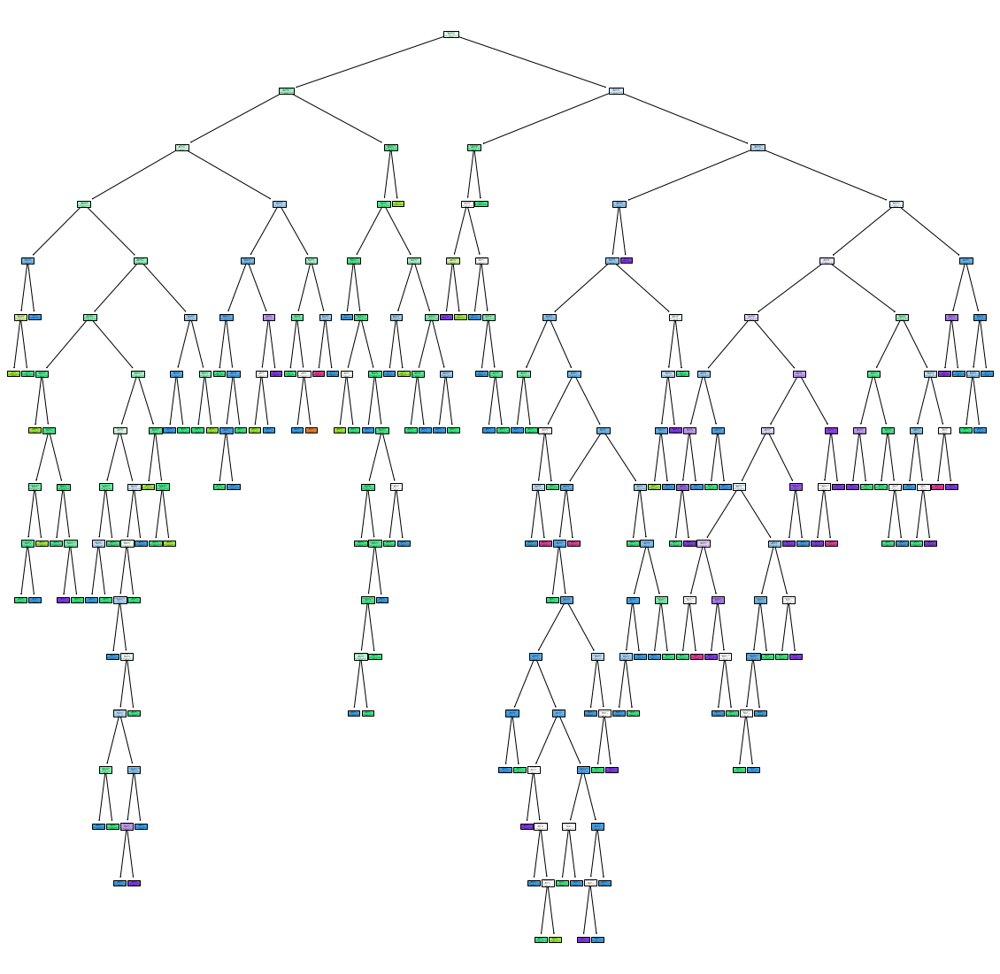

In [19]:
plt.figure(figsize=(20,20))
tree.plot_tree(dtmodel1,filled=True, class_names=[str(i) for i in set(y1)] ,feature_names=x1.columns)

In [20]:
set(y1)

{3, 4, 5, 6, 7, 8}

In [21]:
dtmodel1.predict(X)

array([5, 5, 5, ..., 7, 5, 6], dtype=int64)

In [22]:
dtmodel1.score(x1,y1)

1.0

In [23]:
dtmodel1.score(x_train,y_train)

0.5688073394495413

In [24]:
dtmodel1.score(x_test,y_test)

0.5725

In [25]:
path=dtmodel1.cost_complexity_pruning_path(x1,y1)
ccp_alpha = path.ccp_alphas

In [26]:
ccp_alpha

array([0.        , 0.00166667, 0.00175   , 0.00181818, 0.00184615,
       0.00186667, 0.00188235, 0.00192308, 0.002     , 0.002     ,
       0.002     , 0.002     , 0.002     , 0.002     , 0.002     ,
       0.002     , 0.002     , 0.002     , 0.00203333, 0.00247552,
       0.00261111, 0.00262769, 0.00266667, 0.00266667, 0.00266667,
       0.00266667, 0.00266667, 0.00266667, 0.00266667, 0.00266667,
       0.00272222, 0.00285714, 0.003     , 0.003     , 0.003     ,
       0.003     , 0.00304762, 0.00305051, 0.00308418, 0.00325   ,
       0.00328205, 0.00333333, 0.00333333, 0.00334032, 0.00336606,
       0.00342857, 0.00343316, 0.0035    , 0.0035    , 0.0036    ,
       0.00363636, 0.00373809, 0.0038    , 0.0038237 , 0.004     ,
       0.00404444, 0.00428571, 0.00428571, 0.00437662, 0.00462338,
       0.00465709, 0.00466667, 0.0048    , 0.00487179, 0.00504242,
       0.00508235, 0.00509091, 0.00510606, 0.00516667, 0.00568485,
       0.00589394, 0.00656364, 0.00671079, 0.0067591 , 0.00688

In [27]:
# Testing the trees with different ccp alphas
dt_model2=[]
for ccp in ccp_alpha:
    dt_m = DecisionTreeClassifier(ccp_alpha=ccp)
    dt_m.fit(x1,y1)
    dt_model2.append(dt_m)

In [28]:
dt_model2

[DecisionTreeClassifier(),
 DecisionTreeClassifier(ccp_alpha=0.0016666666666666668),
 DecisionTreeClassifier(ccp_alpha=0.00175),
 DecisionTreeClassifier(ccp_alpha=0.0018181818181818184),
 DecisionTreeClassifier(ccp_alpha=0.0018461538461538455),
 DecisionTreeClassifier(ccp_alpha=0.001866666666666667),
 DecisionTreeClassifier(ccp_alpha=0.001882352941176471),
 DecisionTreeClassifier(ccp_alpha=0.0019230769230769243),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002033333333333334),
 DecisionTreeClassifier(ccp_alpha=0.0024755244755244737),
 DecisionTreeClassifier(ccp_alpha=0.002611111111

Text(0, 0.5, 'score')

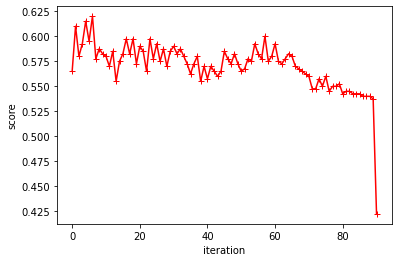

In [29]:
# Testing plot
dt_model2 = []
score = []
for i in ccp_alpha:
    dt_m = DecisionTreeClassifier(ccp_alpha = i)
    dt_m.fit(x1,y1)
    dt_model2.append(dt_m)
    score.append(dt_m.score(x_test, y_test))

    
plt.plot(score, 'r-+')
plt.xlabel('iteration')
plt.ylabel('score')

In [30]:
train_score=[i.score(x1,y1) for i in dt_model2]

In [31]:
test_score=[i.score(x_test,y_test)for i in dt_model2]

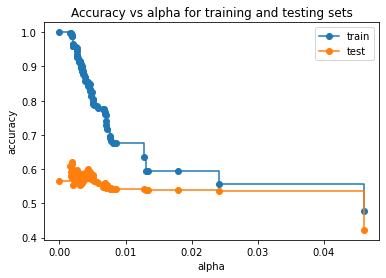

In [32]:
fig, ax = plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs alpha for training and testing sets")
ax.plot(ccp_alpha, train_score, marker='o', label="train",
        drawstyle="steps-post")
ax.plot(ccp_alpha, test_score, marker='o', label="test",
        drawstyle="steps-post")
ax.legend()
plt.show()
# From this we note that from 0.01 to 0.03 if we take then it is the good model

In [33]:
dt_model_ccp=DecisionTreeClassifier(random_state=0,ccp_alpha=0.014)
dt_model_ccp.fit(x1,y1)

DecisionTreeClassifier(ccp_alpha=0.014, random_state=0)

[Text(558.0, 906.0, 'X[10] <= 9.85\ngini = 0.624\nsamples = 500\nvalue = [1, 16, 239, 184, 52, 8]'),
 Text(279.0, 543.6, 'X[6] <= 62.5\ngini = 0.504\nsamples = 259\nvalue = [1, 12, 167, 72, 6, 1]'),
 Text(139.5, 181.19999999999993, 'gini = 0.576\nsamples = 169\nvalue = [1, 9, 91, 61, 6, 1]'),
 Text(418.5, 181.19999999999993, 'gini = 0.271\nsamples = 90\nvalue = [0, 3, 76, 11, 0, 0]'),
 Text(837.0, 543.6, 'X[9] <= 0.545\ngini = 0.657\nsamples = 241\nvalue = [0, 4, 72, 112, 46, 7]'),
 Text(697.5, 181.19999999999993, 'gini = 0.408\nsamples = 32\nvalue = [0, 2, 24, 5, 1, 0]'),
 Text(976.5, 181.19999999999993, 'gini = 0.638\nsamples = 209\nvalue = [0, 2, 48, 107, 45, 7]')]

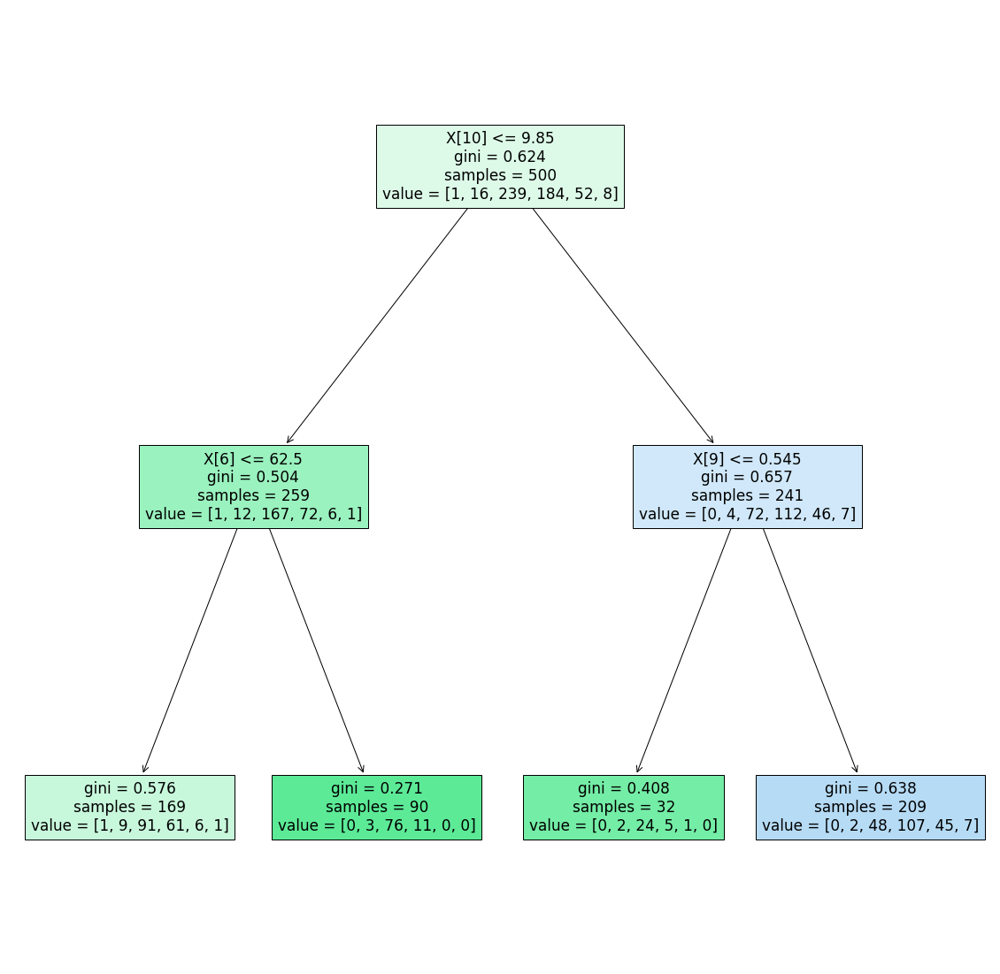

In [34]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model_ccp,filled=True)

In [35]:
dt_model_ccp.score(x1,y1)

0.596

In [36]:
dt_model_ccp.score(x_test,y_test)

0.54

In [37]:
grid_pram = {"criterion":['gini','entropy'],
             "splitter":['best','random'],
             "max_depth" : range(2,40,1),
             "min_samples_split":range(2,10 ,1),
             "min_samples_leaf":range(1,10,1),
             'ccp_alpha':np.random.rand(20)
             }

In [38]:
from sklearn.model_selection import GridSearchCV
grid_ccp = GridSearchCV(estimator=dt_model_ccp,param_grid=grid_pram , cv = 10 , n_jobs=-1)

In [ ]:
grid_ccp.fit(x1,y1)

C:\Users\srena\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:666: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=10.
  warnings.warn(("The least populated class in y has only %d"


In [ ]:
grid_ccp.best_params_

In [ ]:
dt_cpp_new = DecisionTreeClassifier(criterion='gini' , max_depth=11 ,min_samples_leaf=8 , min_samples_split=2 , splitter='random',ccp_alpha=0.014)

In [ ]:
dt_cpp_new.fit(x1,y1)

In [ ]:
dt_cpp_new.score(x1,y1)

In [ ]:
dt_cpp_new.score(x_test,y_test)

In [ ]:
pred = dt_cpp_new.predict(x_train)

In [ ]:
confusion_matrix(y_train,pred)

In [4]:
X=df.drop(columns=['quality'])

In [5]:
Y=df.quality

In [6]:
from sklearn.ensemble import BaggingClassifier

In [7]:
x_train,x_test,y_train,y_test=train_test_split(X,Y,random_state=0)

In [66]:
bag_dt=BaggingClassifier(DecisionTreeClassifier(),n_estimators=10)

In [9]:
bag_dt.fit(x_train,y_train)

BaggingClassifier(base_estimator=DecisionTreeClassifier())

In [10]:
bag_dt.predict(x_test)

array([6, 5, 7, 5, 5, 6, 5, 6, 5, 5, 5, 5, 6, 6, 5, 7, 7, 5, 6, 6, 6, 5,
       6, 7, 5, 5, 5, 7, 5, 6, 5, 5, 6, 5, 7, 7, 5, 6, 6, 7, 5, 7, 5, 6,
       6, 5, 5, 6, 5, 6, 5, 5, 6, 6, 5, 5, 5, 5, 7, 5, 5, 6, 6, 6, 5, 6,
       5, 5, 7, 6, 6, 5, 5, 6, 6, 6, 5, 5, 5, 7, 6, 5, 6, 6, 6, 5, 4, 5,
       6, 5, 5, 6, 6, 5, 7, 6, 6, 5, 5, 5, 7, 6, 6, 6, 5, 5, 5, 5, 6, 5,
       6, 5, 8, 5, 6, 6, 5, 6, 5, 6, 5, 6, 5, 5, 5, 7, 5, 5, 6, 6, 6, 5,
       6, 6, 6, 5, 6, 5, 6, 5, 6, 5, 5, 5, 5, 6, 8, 6, 6, 5, 6, 5, 5, 5,
       6, 6, 6, 6, 6, 6, 6, 6, 7, 5, 5, 5, 6, 6, 6, 6, 6, 5, 6, 7, 4, 6,
       6, 7, 7, 5, 5, 6, 6, 6, 5, 5, 6, 6, 5, 6, 6, 5, 5, 5, 5, 5, 5, 6,
       6, 5, 5, 6, 6, 6, 5, 5, 5, 6, 6, 6, 6, 5, 5, 7, 5, 6, 5, 7, 6, 5,
       5, 6, 5, 6, 6, 6, 6, 6, 6, 6, 5, 6, 5, 5, 7, 6, 6, 7, 7, 6, 5, 5,
       5, 6, 6, 5, 5, 5, 5, 7, 5, 5, 6, 5, 5, 6, 5, 5, 5, 7, 5, 6, 5, 6,
       5, 5, 5, 5, 5, 6, 5, 5, 5, 5, 6, 6, 6, 6, 7, 7, 6, 7, 5, 5, 6, 5,
       5, 5, 7, 6, 5, 5, 6, 6, 5, 6, 6, 6, 5, 5, 6,

In [12]:
bag_dt.base_estimator_

DecisionTreeClassifier()

In [13]:
bag_dt.classes_

array([3, 4, 5, 6, 7, 8], dtype=int64)

In [14]:
bag_dt.estimator_params

()

In [15]:
from sklearn.neighbors import KNeighborsClassifier

In [16]:
bag_knn = BaggingClassifier(KNeighborsClassifier(6) , n_estimators=10)

In [18]:
bag_knn.fit(x_train,y_train)

BaggingClassifier(base_estimator=KNeighborsClassifier(n_neighbors=6))

In [19]:
bag_knn.predict(x_test)

array([6, 6, 7, 6, 6, 5, 6, 6, 6, 6, 5, 6, 5, 6, 6, 6, 7, 6, 7, 5, 6, 6,
       6, 5, 6, 5, 6, 6, 5, 6, 6, 6, 5, 6, 7, 7, 5, 6, 6, 6, 6, 7, 6, 5,
       6, 6, 5, 6, 5, 6, 6, 5, 5, 6, 6, 5, 5, 5, 7, 5, 5, 6, 6, 5, 5, 5,
       5, 7, 7, 7, 5, 5, 5, 5, 6, 6, 5, 5, 5, 6, 5, 6, 4, 6, 6, 5, 5, 5,
       5, 5, 5, 5, 5, 5, 5, 5, 5, 6, 5, 5, 7, 5, 6, 6, 6, 6, 6, 7, 6, 5,
       6, 5, 6, 6, 5, 6, 5, 7, 7, 6, 5, 7, 6, 5, 5, 5, 5, 5, 5, 7, 5, 5,
       6, 5, 6, 5, 6, 5, 6, 5, 6, 6, 5, 6, 5, 6, 6, 7, 5, 6, 6, 5, 7, 6,
       5, 6, 6, 6, 6, 6, 6, 6, 5, 6, 6, 5, 6, 5, 6, 5, 5, 7, 6, 7, 7, 5,
       7, 7, 7, 5, 5, 6, 6, 6, 7, 5, 6, 6, 5, 6, 5, 5, 5, 5, 5, 5, 5, 5,
       6, 5, 5, 6, 6, 6, 5, 5, 6, 6, 6, 5, 5, 5, 5, 5, 5, 6, 5, 6, 6, 5,
       5, 5, 7, 6, 5, 6, 5, 5, 5, 4, 5, 6, 5, 5, 7, 6, 7, 5, 7, 6, 6, 5,
       6, 6, 5, 5, 5, 5, 5, 5, 5, 6, 5, 6, 5, 5, 5, 6, 5, 6, 5, 6, 6, 5,
       5, 5, 6, 5, 6, 5, 5, 5, 6, 5, 6, 6, 7, 5, 6, 7, 6, 6, 5, 5, 5, 5,
       5, 5, 6, 6, 5, 5, 5, 6, 5, 6, 5, 5, 5, 6, 6,

In [20]:
from sklearn.ensemble import RandomForestClassifier

In [21]:
rf = RandomForestClassifier(n_estimators=5)

In [22]:
rf.fit(x_train,y_train)

RandomForestClassifier(n_estimators=5)

In [26]:
rf.score(x_test,y_test)

0.6

In [27]:
bag_dt.score(x_test,y_test)

0.66

In [28]:
bag_knn.score(x_test,y_test)

0.4925

In [29]:
rf.estimators_

[DecisionTreeClassifier(max_features='auto', random_state=163706822),
 DecisionTreeClassifier(max_features='auto', random_state=1479534484),
 DecisionTreeClassifier(max_features='auto', random_state=212629550),
 DecisionTreeClassifier(max_features='auto', random_state=1066026198),
 DecisionTreeClassifier(max_features='auto', random_state=1063598761)]

In [30]:
rf.estimators_[0]

DecisionTreeClassifier(max_features='auto', random_state=163706822)

[Text(438.8187468370445, 1066.2923076923078, 'X[1] <= 0.405\ngini = 0.655\nsamples = 754\nvalue = [4, 43, 507, 454, 175, 16]'),
 Text(107.02530364372468, 1024.4769230769232, 'X[7] <= 0.996\ngini = 0.66\nsamples = 205\nvalue = [0, 3, 67, 139, 112, 6]'),
 Text(33.886639676113354, 982.6615384615385, 'X[3] <= 1.95\ngini = 0.518\nsamples = 54\nvalue = [0, 0, 8, 20, 60, 4]'),
 Text(18.072874493927124, 940.8461538461539, 'X[10] <= 10.75\ngini = 0.729\nsamples = 19\nvalue = [0, 0, 8, 8, 10, 4]'),
 Text(13.554655870445343, 899.0307692307692, 'gini = 0.0\nsamples = 4\nvalue = [0, 0, 6, 0, 0, 0]'),
 Text(22.591093117408903, 899.0307692307692, 'X[6] <= 27.0\ngini = 0.681\nsamples = 15\nvalue = [0, 0, 2, 8, 10, 4]'),
 Text(13.554655870445343, 857.2153846153847, 'X[4] <= 0.068\ngini = 0.555\nsamples = 9\nvalue = [0, 0, 2, 1, 10, 3]'),
 Text(9.036437246963562, 815.4000000000001, 'gini = 0.0\nsamples = 4\nvalue = [0, 0, 0, 0, 8, 0]'),
 Text(18.072874493927124, 815.4000000000001, 'X[0] <= 9.45\ngini = 

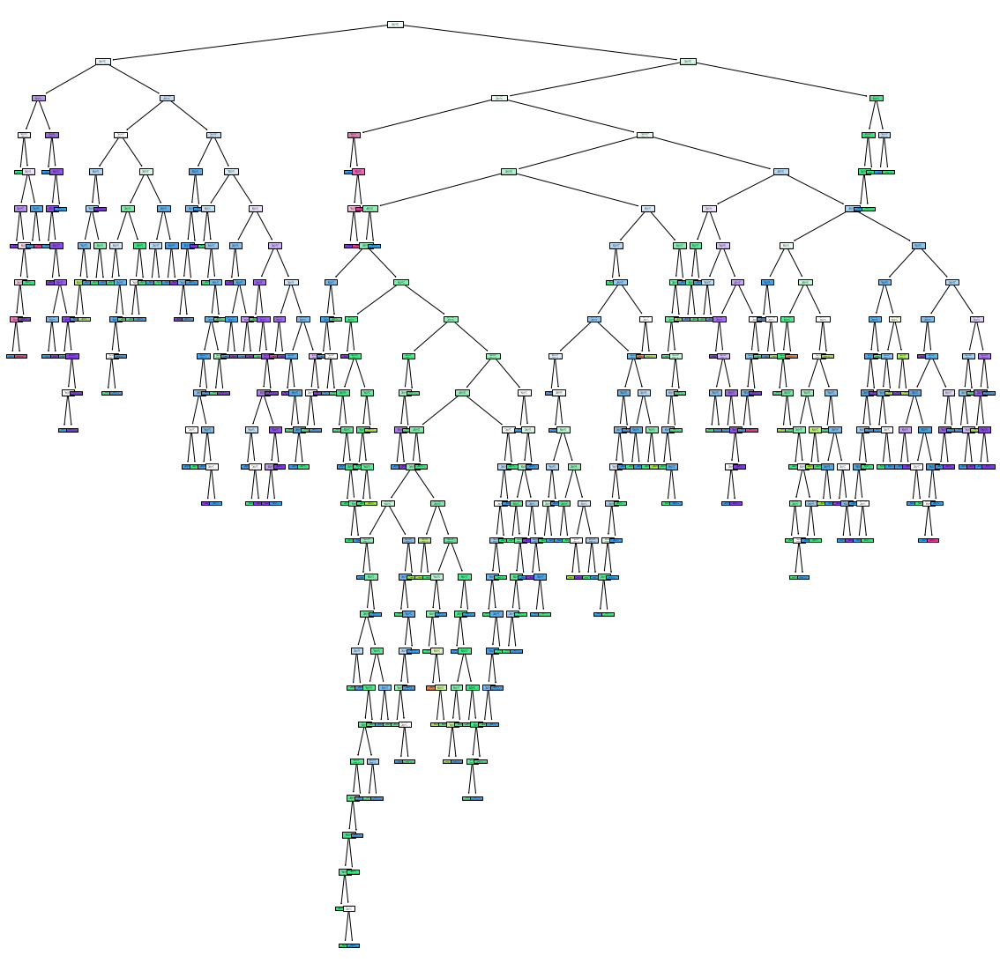

In [32]:
import matplotlib.pyplot as plt
plt.figure(figsize= (20,20))
tree.plot_tree(rf.estimators_[0],filled=True)


[Text(733.8288182848282, 1055.2235294117647, 'X[6] <= 81.5\ngini = 0.636\nsamples = 748\nvalue = [6, 47, 521, 480, 137, 8]'),
 Text(473.9613996898855, 991.2705882352941, 'X[9] <= 0.585\ngini = 0.646\nsamples = 631\nvalue = [6, 44, 382, 451, 129, 7]'),
 Text(133.2271588740458, 927.3176470588236, 'X[8] <= 3.195\ngini = 0.53\nsamples = 220\nvalue = [5, 25, 226, 97, 8, 0]'),
 Text(19.167938931297712, 863.364705882353, 'X[6] <= 10.0\ngini = 0.292\nsamples = 37\nvalue = [0, 0, 58, 10, 2, 0]'),
 Text(10.648854961832061, 799.4117647058824, 'X[7] <= 0.995\ngini = 0.444\nsamples = 2\nvalue = [0, 0, 0, 1, 2, 0]'),
 Text(6.389312977099237, 735.4588235294118, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 0, 1, 0, 0]'),
 Text(14.908396946564887, 735.4588235294118, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 0, 0, 2, 0]'),
 Text(27.68702290076336, 799.4117647058824, 'X[10] <= 11.55\ngini = 0.233\nsamples = 35\nvalue = [0, 0, 58, 9, 0, 0]'),
 Text(23.427480916030536, 735.4588235294118, 'X[5] <= 11.0\ngini = 0

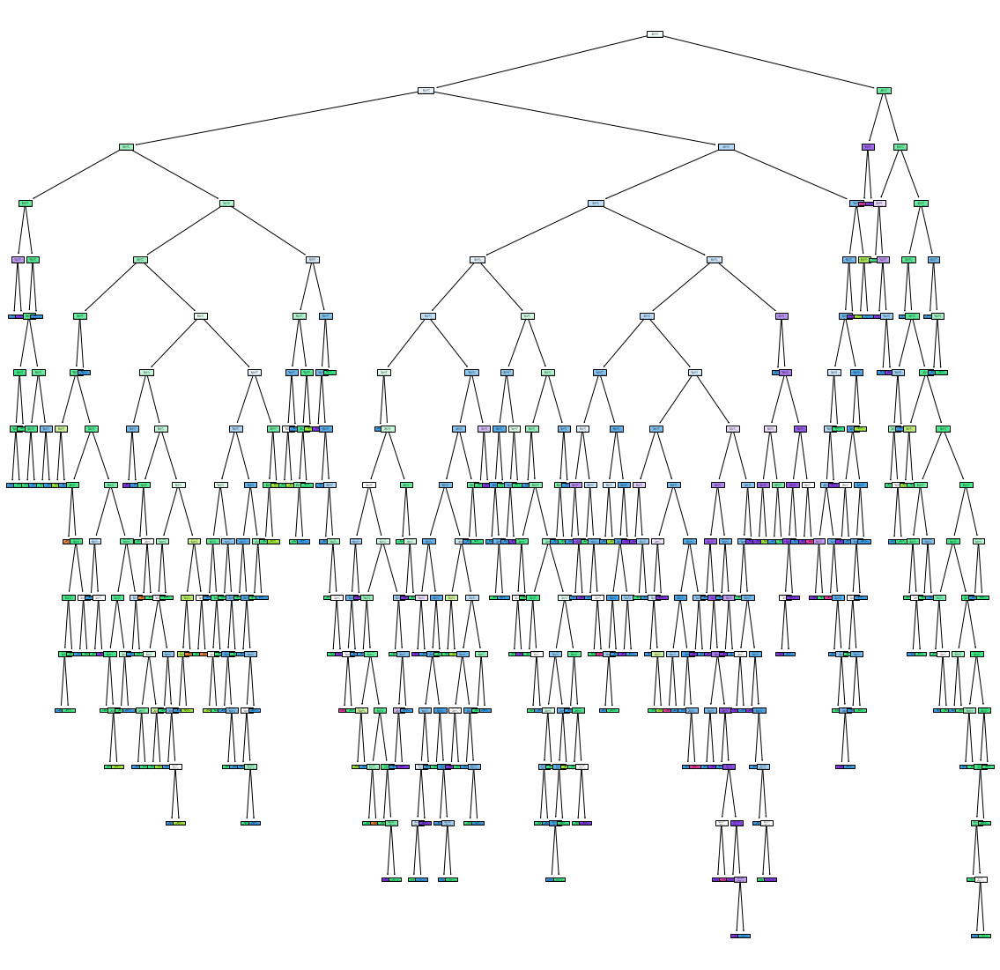

In [33]:
plt.figure(figsize= (20,20))
tree.plot_tree(rf.estimators_[2],filled=True)

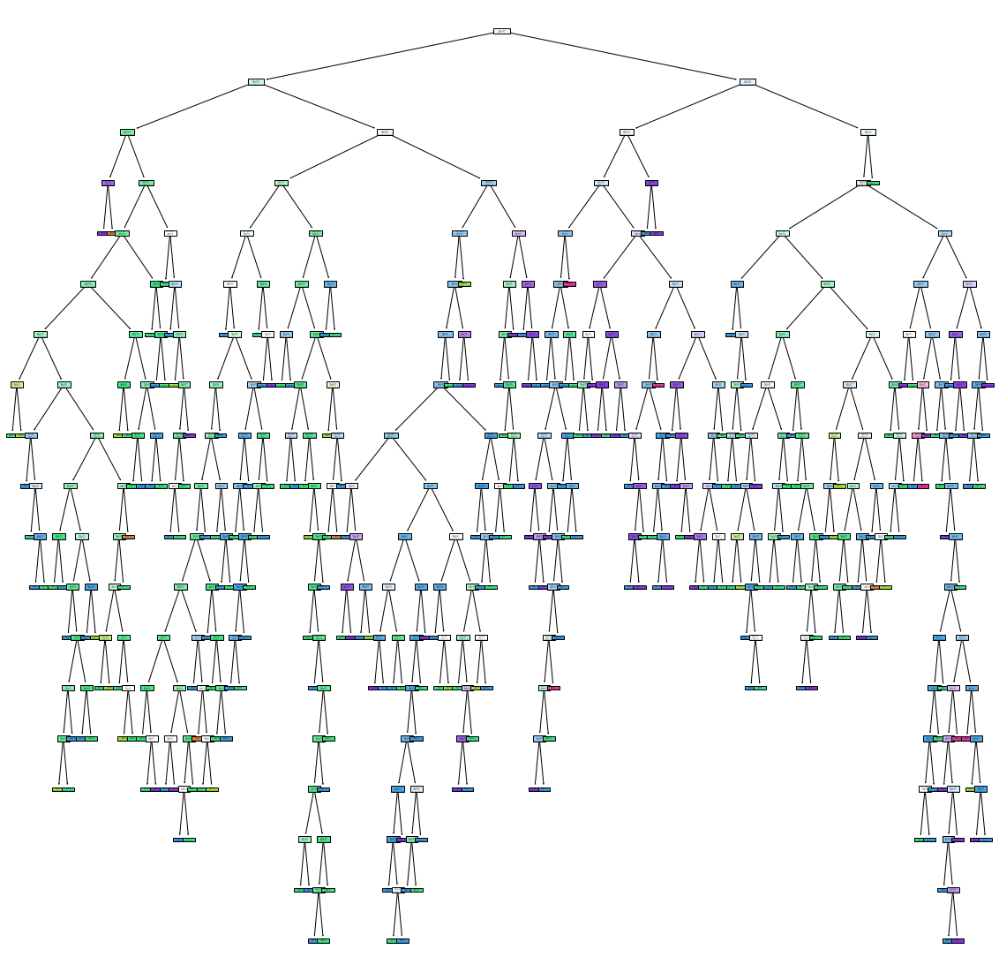

In [34]:
plt.figure(figsize = (20,20))
for i in range(len(rf.estimators_)):
    tree.plot_tree(rf.estimators_[i] , filled = True )

In [8]:
grid_pram = {
    "n_estimators" : [5,10 , 50 , 100 , 120 , 150],
    'criterion' :['gini' ,'entropy'],
    'max_depth' :range(10),
    'min_samples_leaf' :range(10)
    
}


In [9]:
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier(n_estimators=5)

In [10]:
from sklearn.model_selection import GridSearchCV
grid_serach_rf = GridSearchCV(param_grid= grid_pram, cv = 10 , n_jobs=6,verbose=1 ,estimator = rf)

In [11]:
grid_serach_rf.fit(x_train,y_train)

Fitting 10 folds for each of 1200 candidates, totalling 12000 fits


C:\Users\srena\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:666: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(("The least populated class in y has only %d"
C:\Users\srena\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:922: UserWarning: One or more of the test scores are non-finite: [       nan        nan        nan ... 0.63135854 0.63139356 0.62971289]
  warnings.warn(


GridSearchCV(cv=10, estimator=RandomForestClassifier(n_estimators=5), n_jobs=6,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': range(0, 10),
                         'min_samples_leaf': range(0, 10),
                         'n_estimators': [5, 10, 50, 100, 120, 150]},
             verbose=1)

In [13]:
grid_serach_rf.best_params_

{'criterion': 'entropy',
 'max_depth': 9,
 'min_samples_leaf': 1,
 'n_estimators': 150}

In [14]:
rf_new = RandomForestClassifier(criterion='entropy' , max_depth=9 , min_samples_leaf= 1 , n_estimators=150)

In [15]:
rf_new.fit(x_train,y_train)

RandomForestClassifier(criterion='entropy', max_depth=9, n_estimators=150)

In [1]:
rf_new.score(x_test,y_test)

NameError: name 'rf_new' is not defined

[Text(481.8304503916449, 1032.8400000000001, 'X[10] <= 10.525\nentropy = 1.751\nsamples = 774\nvalue = [8, 58, 515, 467, 135, 16]'),
 Text(186.12140992167102, 924.1200000000001, 'X[1] <= 0.365\nentropy = 1.379\nsamples = 487\nvalue = [4, 30, 437, 249, 24, 1]'),
 Text(56.81984334203655, 815.4000000000001, 'X[10] <= 9.75\nentropy = 1.508\nsamples = 63\nvalue = [0, 2, 23, 52, 10, 1]'),
 Text(34.96605744125326, 706.6800000000001, 'X[6] <= 66.5\nentropy = 1.365\nsamples = 28\nvalue = [0, 2, 20, 19, 1, 0]'),
 Text(29.138381201044385, 597.96, 'X[0] <= 10.95\nentropy = 1.377\nsamples = 21\nvalue = [0, 2, 10, 19, 1, 0]'),
 Text(17.48302872062663, 489.24, 'X[7] <= 0.998\nentropy = 1.361\nsamples = 13\nvalue = [0, 2, 10, 8, 0, 0]'),
 Text(11.655352480417754, 380.5200000000001, 'X[1] <= 0.235\nentropy = 0.722\nsamples = 8\nvalue = [0, 2, 0, 8, 0, 0]'),
 Text(5.827676240208877, 271.80000000000007, 'entropy = 0.0\nsamples = 1\nvalue = [0, 2, 0, 0, 0, 0]'),
 Text(17.48302872062663, 271.80000000000007

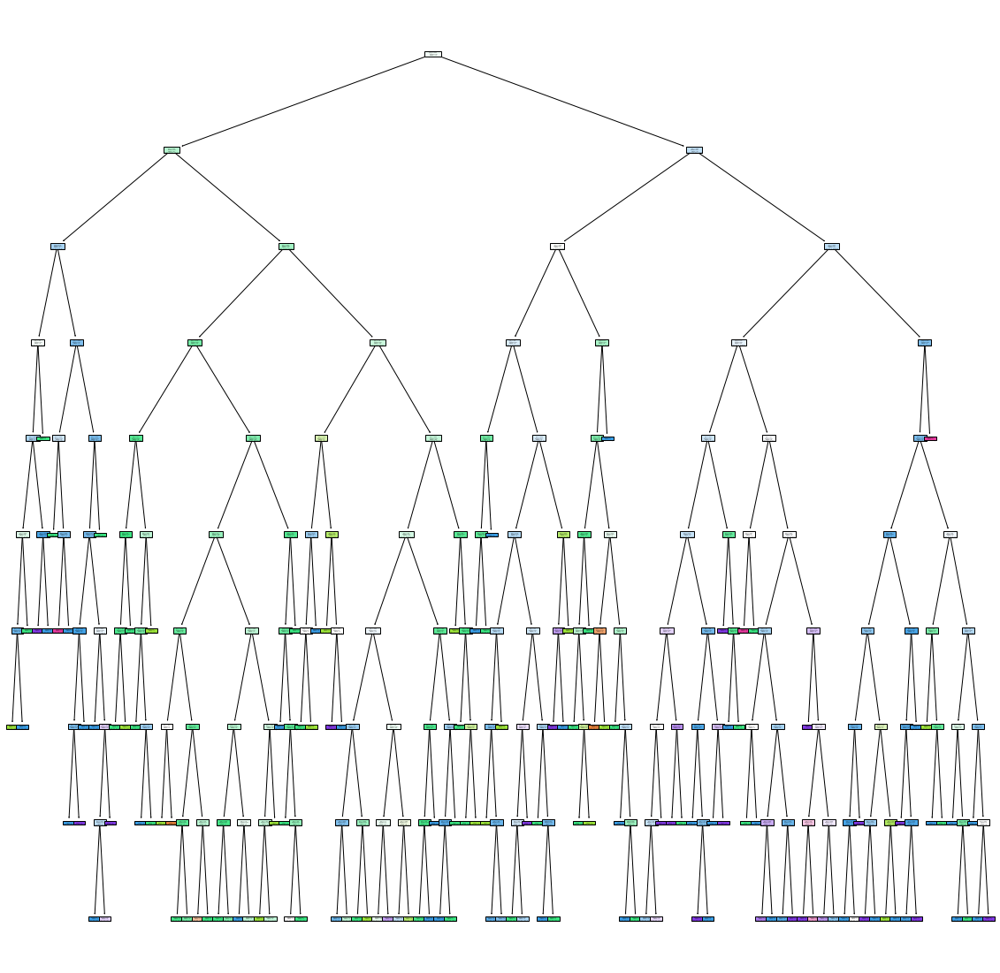

In [18]:
import matplotlib.pyplot as plt
plt.figure(figsize = (20,20))
tree.plot_tree(rf_new.estimators_[0] , filled = True )